In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
import pylab
from pandas_profiling import ProfileReport

from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, StratifiedKFold
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

from xgboost import XGBClassifier

from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori

%matplotlib inline
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = [20, 10]

import warnings
warnings.filterwarnings('ignore')

# Reingresos de pacientes diagnosticados con diabetes

## Cargando los datos

In [2]:
diabetes = pd.read_csv('data/diabetic_data.csv')
admission_source_id = pd.read_csv('data/admission_source_id.csv')
admission_type_id = admission_source = pd.read_csv('data/admission_type_id.csv')
discharge_disposition_id = admission_source = pd.read_csv('data/discharge_disposition_id.csv')

In [3]:
diabetes.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [4]:
discharge_disposition_id.head(20)

,discharge_disposition_id,description
0,1,Discharged to home
1,2,Discharged/transferred to another short term h...
2,3,Discharged/transferred to SNF
3,4,Discharged/transferred to ICF
4,5,Discharged/transferred to another type of inpa...
5,6,Discharged/transferred to home with home healt...
6,7,Left AMA
7,8,Discharged/transferred to home under care of H...
8,9,Admitted as an inpatient to this hospital
9,10,Neonate discharged to another hospital for neo...


In [5]:
diabetes.columns

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

## Limpieza de datos
### Valores nulos

La limpieza de los datos la inciaremos con definir cuáles son nuestros valores nulos o inválidos, para luego decidir columna por columna qué hacer con ellos. Identificamos entonces que los valores marcados con '?' son nules (especialmente en peso)

In [6]:
diabetes = diabetes.replace('?', np.nan)

Veamos entonces en un heatmap los datos faltantes

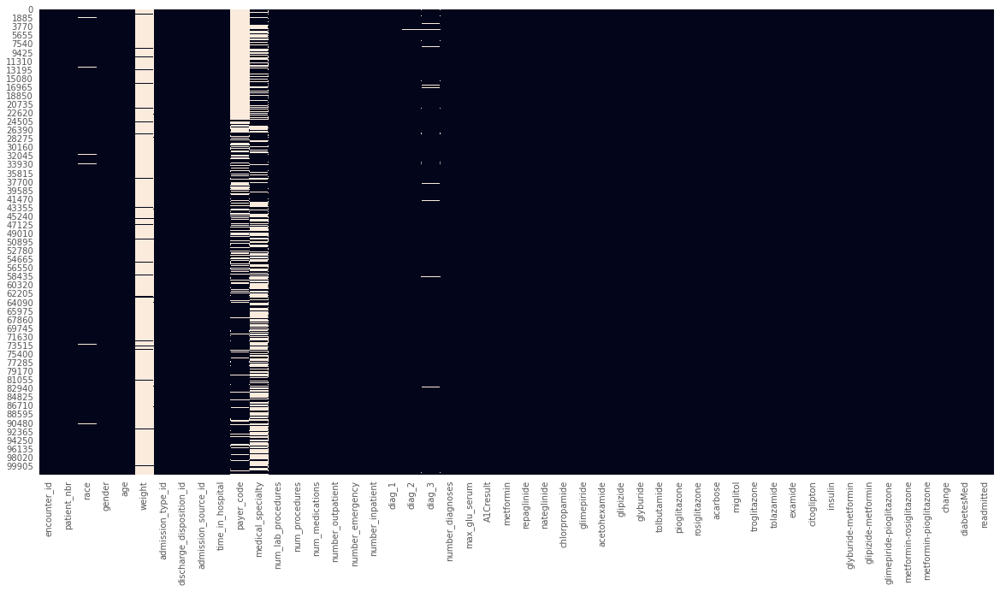

In [7]:
_ = sns.heatmap(diabetes.isnull(), cbar=False)

En primera instancia tenemos un gran volumen de datos faltantes de la variable `weight` y `payer_code`. Por el lado de `weight` la columna va a ser **decartada**, dado que la cantidad de valores (cerca de un 3%) no son representativos para el modelo. `payer_code` es una variable externa que no describe al paciente, sino hace referencia a temas administrativos y de pago.

`encounter_id` y `patient_nbr` son identificadores de los registros y pacientes. Bien podrían ser índices pero van a ser descartados del modelo para evitar información no referente al contexto médico.

### Valores binarios

In [8]:
diabetes.change      = diabetes.change.map({'Ch':1, 'No':0})
diabetes.diabetesMed = diabetes.diabetesMed.map({'Yes':1, 'No':0})
age_map = {
    '[0-10)':5,
    '[10-20)':15,
    '[20-30)':25,
    '[30-40)':35,
    '[40-50)':45,
    '[50-60)':55,
    '[60-70)':65,
    '[70-80)':75,
    '[80-90)':85,
    '[90-100)':95
}
diabetes.age = diabetes.age.map(age_map)

### Distribución de variables
Vamos a ver ahora el comportamiento de las variables más generales y con alto impacto semántico en el contexto.
#### Paciente

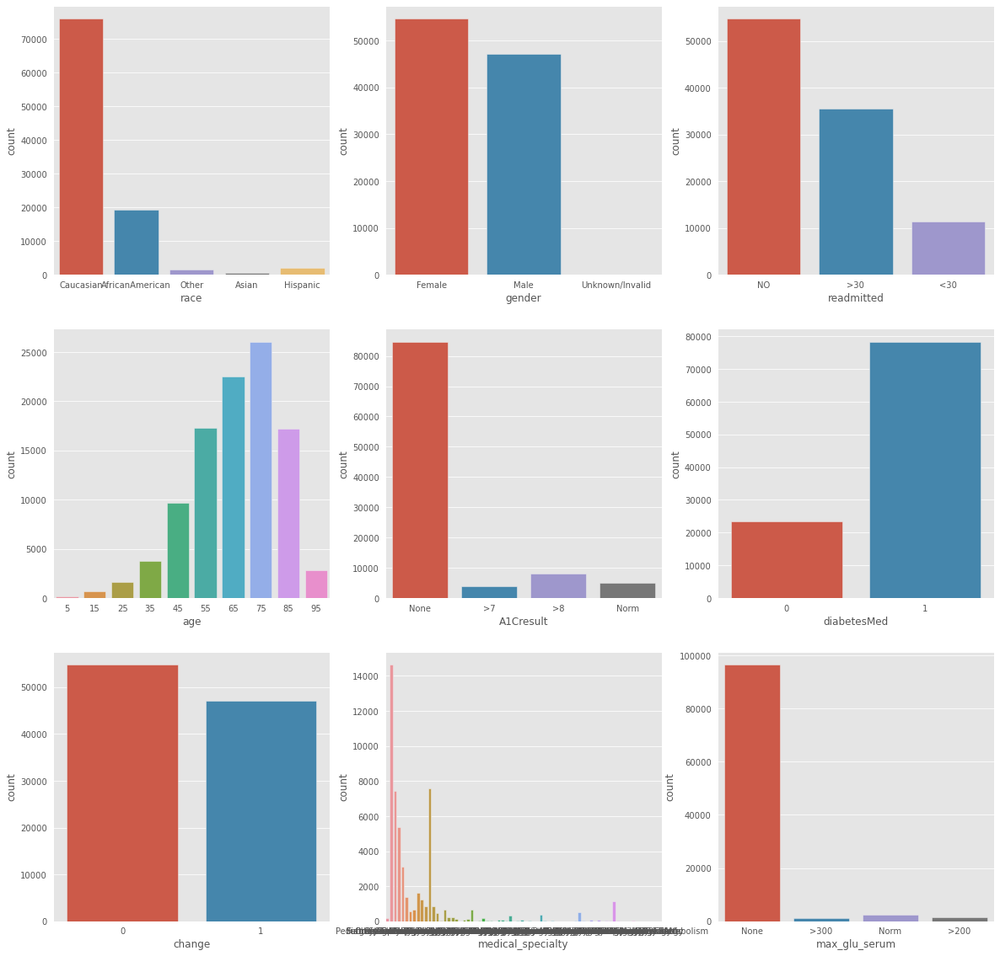

In [9]:
plt.rcParams["figure.figsize"] = [20, 20]
fig, axs = plt.subplots(ncols=3, nrows=3)
_ = sns.countplot(x="race", data=diabetes, ax=axs[0,0])
_ = sns.countplot(x="gender", data=diabetes, ax=axs[0,1])
_ = sns.countplot(x="readmitted", data=diabetes, ax=axs[0,2])
_ = sns.countplot(x="age", data=diabetes, ax=axs[1,0])
_ = sns.countplot(x="A1Cresult", data=diabetes, ax=axs[1,1])
_ = sns.countplot(x="diabetesMed", data=diabetes, ax=axs[1,2])
_ = sns.countplot(x="change", data=diabetes, ax=axs[2,0])
_ = sns.countplot(x="medical_specialty", data=diabetes, ax=axs[2,1])
_ = sns.countplot(x="max_glu_serum", data=diabetes, ax=axs[2,2])

Por lo pronto eliminaremos el género con valor `Unknown/Invalid` dado que la muestra es muy pequeña y eventualmente será una clase más y una columna más, que podemos evadir dado su bajo nivel de registros (3 registros)

In [10]:
diabetes = diabetes[diabetes.gender != 'Unknown/Invalid']

#### Medicamentos
Los 23 medicamentos presentes en el dataset están involucrados en el tratamiento de diabetes, por lo que evaluarenmos el comportamiento y la distribución de las 4 categorías `No`, `Up`, `Steady` y `Down` y tomaremos decisiones con base a eso.

In [11]:
columns_medication = ['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone']

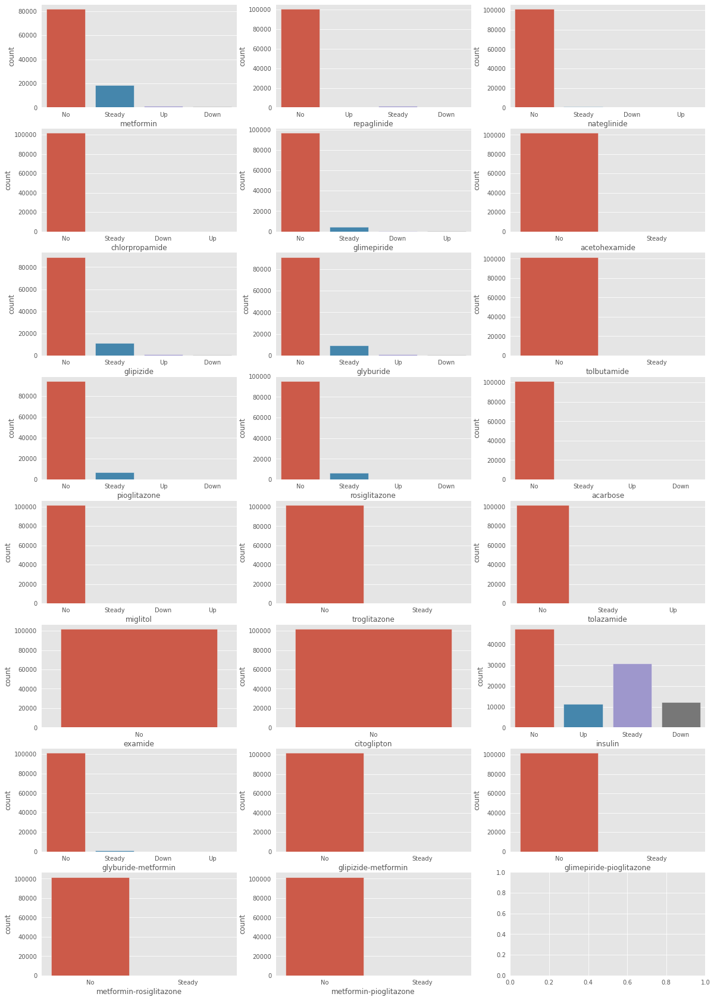

In [12]:
plt.rcParams["figure.figsize"] = [20, 30]
fig, axs = plt.subplots(ncols=3, nrows=8)
count= 0
for x in columns_medication:
    _ = sns.countplot(x=x, data=diabetes, ax=axs[int(count/3), count%3])
    count+=1

La mayoría de los medicamentos tienen una bajísima variedad de valores (distribuciones extremadamente desbalanceadas) por lo que solo se mantendrá los valores de la **insulina**.

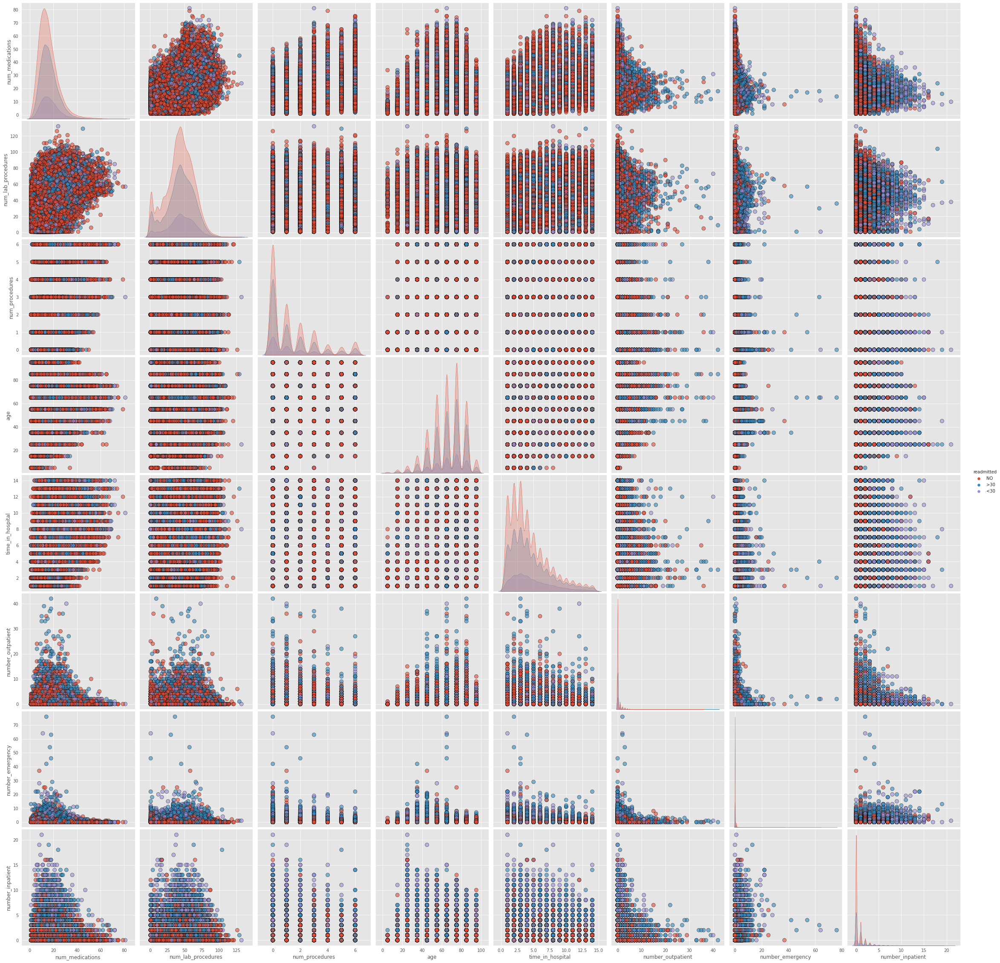

In [13]:
plt.rcParams["figure.figsize"] = [20, 20]

numerical_columns = ['num_medications', 'num_lab_procedures', 'num_procedures', 'age', 'time_in_hospital', 'number_outpatient', 'number_emergency', 'number_inpatient']
_ = sns.pairplot(diabetes, vars=numerical_columns, hue = 'readmitted', diag_kind = 'kde', plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'}, size = 4)

En esta gráfica podemos ver unos comportamientos interesantes que concluiremos más adelante.

--------
## Transformación de variables continuas

Algunas de nuestras variables numéricas tienen una distribución inconveniente para algunos modelos que usaremos, por lo que procederemos a normalizarlas con log(x+1)

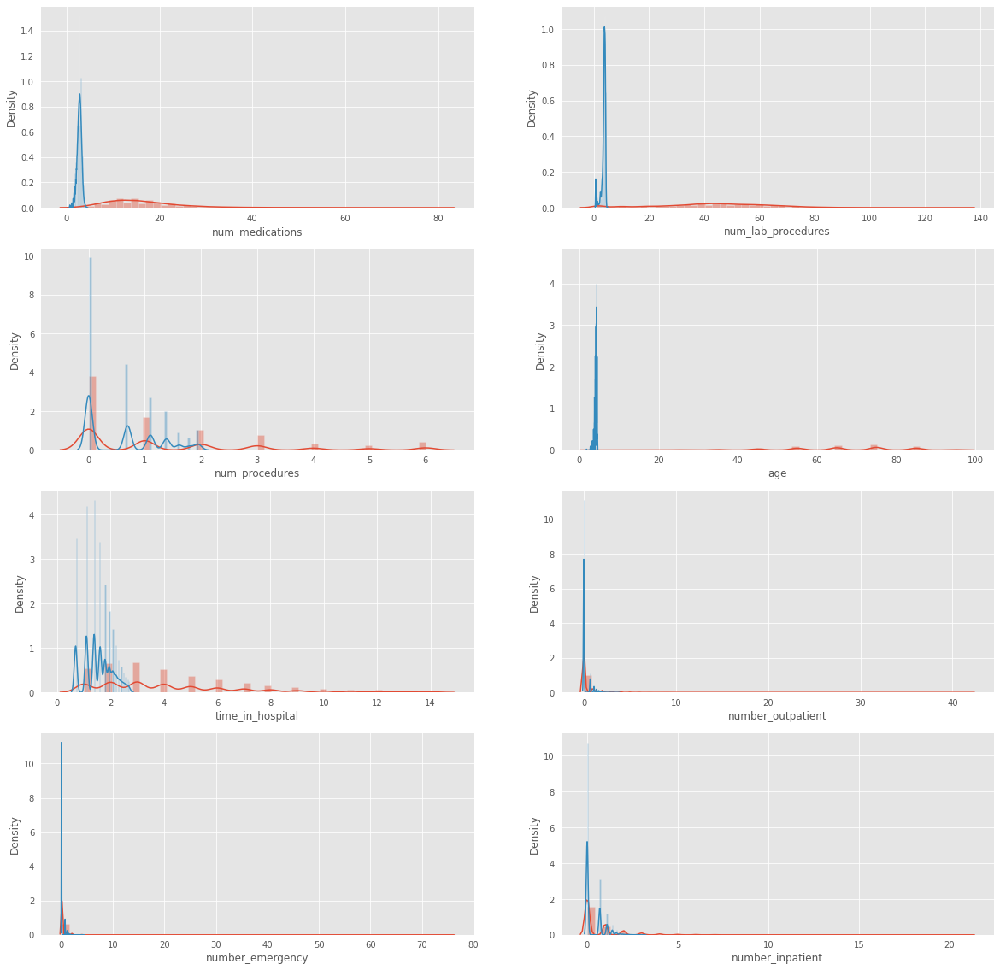

In [14]:
plt.rcParams["figure.figsize"] = [20, 20]

fig, axs = plt.subplots(nrows=4, ncols=2)
numerical_columns = ['num_medications', 'num_lab_procedures', 'num_procedures', 'age', 'time_in_hospital', 'number_outpatient', 'number_emergency', 'number_inpatient']
count= 0
for x in numerical_columns:
    _ = sns.distplot(diabetes[x], ax=axs[int(count/2), count%2])
    _ = sns.distplot(np.log(diabetes[x]+1), ax=axs[int(count/2), count%2])
    count+=1

In [15]:
for i in ['num_medications', 'num_lab_procedures', 'num_procedures', 'age', 'time_in_hospital', 'number_outpatient', 'number_emergency', 'number_inpatient']:
    diabetes[i] = diabetes[i].apply(lambda x: np.log(x+1))

-------------
### Categorías de diagnóstico

Los diagnósticos tienen una alta variedad de categorías (cerca de 800 valores distintos por columna) por lo que obtendremos categorías más generales sobre el estandar [icd9cm](https://icd.codes/icd9cm).

In [16]:
def get_diag_cat(code):
    if 'V' in str(code):
        return '18'
    if 'E' in str(code):
        return '19'
    c = float(code)
    if 0 <= c and c <=139:
        return '01'
    if 139 < c and c <=239:
        return '02'
    if 239 < c and c <=279:
        return '03'
    if 279 < c and c <=289:
        return '04'
    if 289 < c and c <=319:
        return '05'
    if 319 < c and c <=389:
        return '06'
    if 389 < c and c <=459:
        return '07'
    if 459 < c and c <=519:
        return '08'
    if 519 < c and c <=579:
        return '09'
    if 579 < c and c <=629:
        return '10'
    if 629 < c and c <=679:
        return '11'
    if 679 < c and c <=709:
        return '12'
    if 709 < c and c <=739:
        return '13'
    if 739 < c and c <=759:
        return '14'
    if 759 < c and c <=779:
        return '15'
    if 779 < c and c <=799:
        return '16'
    if 799 < c and c <=999:
        return '17'
    return np.nan

In [17]:
diabetes['cat_diag_1'] = diabetes.diag_1.apply(get_diag_cat)
diabetes['cat_diag_2'] = diabetes.diag_2.apply(get_diag_cat)
diabetes['cat_diag_3'] = diabetes.diag_3.apply(get_diag_cat)

In [18]:
diabetes.columns

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted',
       'cat_diag_1', 'cat_diag_2', 'cat_diag_3'],
      dtype='object')

### Eliminar columnas

Eliminaremos entonces algunas columnas que no usaremos y seleccionaremos las columnas categóricas para codificarlas en formato binario más adelante. Este proceso se hará para la mayoría de los modelos que usaremos.

In [19]:
avoid_medicaments = ['examide', 'citoglipton']
avoid_columns = ['weight', 'encounter_id', 'patient_nbr', 'payer_code', 'diag_1', 'diag_2', 'diag_3']
categorical_columns = ['race',
     'gender',
     'admission_type_id',
     'discharge_disposition_id',
     'admission_source_id',
     'medical_specialty',
     'max_glu_serum',
     'A1Cresult',
     'metformin',
     'repaglinide',
     'nateglinide',
     'chlorpropamide',
     'glimepiride',
     'acetohexamide',
     'glipizide',
     'glyburide',
     'tolbutamide',
     'pioglitazone',
     'rosiglitazone',
     'acarbose',
     'miglitol',
     'troglitazone',
     'tolazamide',
     'insulin',
     'glyburide-metformin',
     'glipizide-metformin',
     'glimepiride-pioglitazone',
     'metformin-rosiglitazone',
     'metformin-pioglitazone',
                      'cat_diag_1', 'cat_diag_2', 'cat_diag_3']

diabetes_model = diabetes.copy()

diabetes_model.drop(avoid_columns, axis=1, inplace=True)
diabetes_model.drop(avoid_medicaments, axis=1, inplace=True)


-----------
## Profiling

In [20]:
profile = ProfileReport(diabetes_model, title='Pandas Profiling Report', explorative=True)
profile.to_file("diabetes.html")
profile

## Encoding


In [21]:
diabetes_model = pd.get_dummies(data=diabetes_model, columns=categorical_columns)
diabetes_model.head()

,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,change,...,cat_diag_3_09,cat_diag_3_10,cat_diag_3_11,cat_diag_3_12,cat_diag_3_13,cat_diag_3_14,cat_diag_3_16,cat_diag_3_17,cat_diag_3_18,cat_diag_3_19
0,1.791759,0.693147,3.737670,0.000000,0.693147,0.000000,0.0,0.000000,1,0,...,0,0,0,0,0,0,0,0,0,0
1,2.772589,1.386294,4.094345,0.000000,2.944439,0.000000,0.0,0.000000,9,1,...,0,0,0,0,0,0,0,0,0,0
2,3.258097,1.098612,2.484907,1.791759,2.639057,1.098612,0.0,0.693147,6,0,...,0,0,0,0,0,0,0,0,1,0
3,3.583519,1.098612,3.806662,0.693147,2.833213,0.000000,0.0,0.000000,7,1,...,0,0,0,0,0,0,0,0,0,0
4,3.828641,0.693147,3.951244,0.000000,2.197225,0.000000,0.0,0.000000,5,1,...,0,0,0,0,0,0,0,0,0,0


---------------
## Modelos

Vamos a probar con varias combinaciones de datos, basado en la semántica, en la calidad de los datos y en la importancia de los mismos sobre los modelos.

Definiremos primero dos funciones cuyo objetivo es ofrecer métricas de comparación de los modelos y otra para codificar las variables categóricas en formato binario (one hot encoding).

In [22]:
def get_metrics(y_real, y_pred):
    metrics_list = {
        'acuraccy': metrics.accuracy_score,
        'recall':   metrics.recall_score,
        'f1':       metrics.f1_score
    }
    results = []
    index = []
    for key, m in metrics_list.items():
        try:
            result = m(y_real, y_pred)
            results.append(result)
            index.append(key)
        except:
            print("Error con {}".format(key))
            
    return pd.Series(results, index =index)

In [23]:
def one_hot_encoding(avoid_columns, categorical_columns, data, numerical_columns=[], dummy=True):
    dataset_model = data.copy()
    for column in numerical_columns:
        dataset_model[column] = StandardScaler().fit_transform(dataset_model[column].values.reshape(-1, 1))
    dataset_model.drop(avoid_columns, axis=1, inplace=True)
    if dummy:
        dataset_model = pd.get_dummies(data=dataset_model, columns=categorical_columns)
    return dataset_model

-------------
### Solo Insulina

En este modelo quitaremos todos los medicamentos que tenemos a excepción de la insulina. A pesar de que semánticamente todos los medicamentos están relacionados con el tratamiento de la diabetes, solo la insulina parece tener sus valores medianamente balanceados, los demás tienen mayoritariamente `No`.

In [24]:
columns_medication_avoid = [x for x in columns_medication if x != 'insulin']

In [25]:
avoid_columns = ['weight', 'encounter_id', 'patient_nbr', 'payer_code', 'diag_1', 'diag_2', 'diag_3', 'cat_diag_1', 'cat_diag_2', 'cat_diag_3']
categorical_columns = ['race',
             'gender',
             'admission_type_id',
             'discharge_disposition_id',
             'admission_source_id',
             'medical_specialty',
             'max_glu_serum',
             'A1Cresult',
             'insulin']

diabetes_model = one_hot_encoding(avoid_columns + columns_medication_avoid, categorical_columns, diabetes)

#### Separación de datos

In [26]:
X_train, X_test, y_train, y_test = train_test_split(diabetes_model.drop(['readmitted'], axis=1), diabetes_model['readmitted'], test_size=0.2, random_state=0)

#### Regresión logística

Modelo de clasificación con Regresión Logística

In [27]:
lg_reg = LogisticRegression(random_state=0).fit(X_train, y_train)

In [28]:
y_pred = lg_reg.predict(X_test)
print(get_metrics(y_test, y_pred))

Error con recall
Error con f1
acuraccy    0.583354
dtype: float64


#### Random Forest

Para este modelo usaremos un clasificador de RandomForest y evaluaremos su desempeño

In [29]:
random_forest=RandomForestClassifier(n_estimators=100)

random_forest.fit(X_train,y_train)

RandomForestClassifier()

In [30]:
y_pred = random_forest.predict(X_test)
print(get_metrics(y_test, y_pred))

Error con recall
Error con f1
acuraccy    0.576868
dtype: float64


No handles with labels found to put in legend.


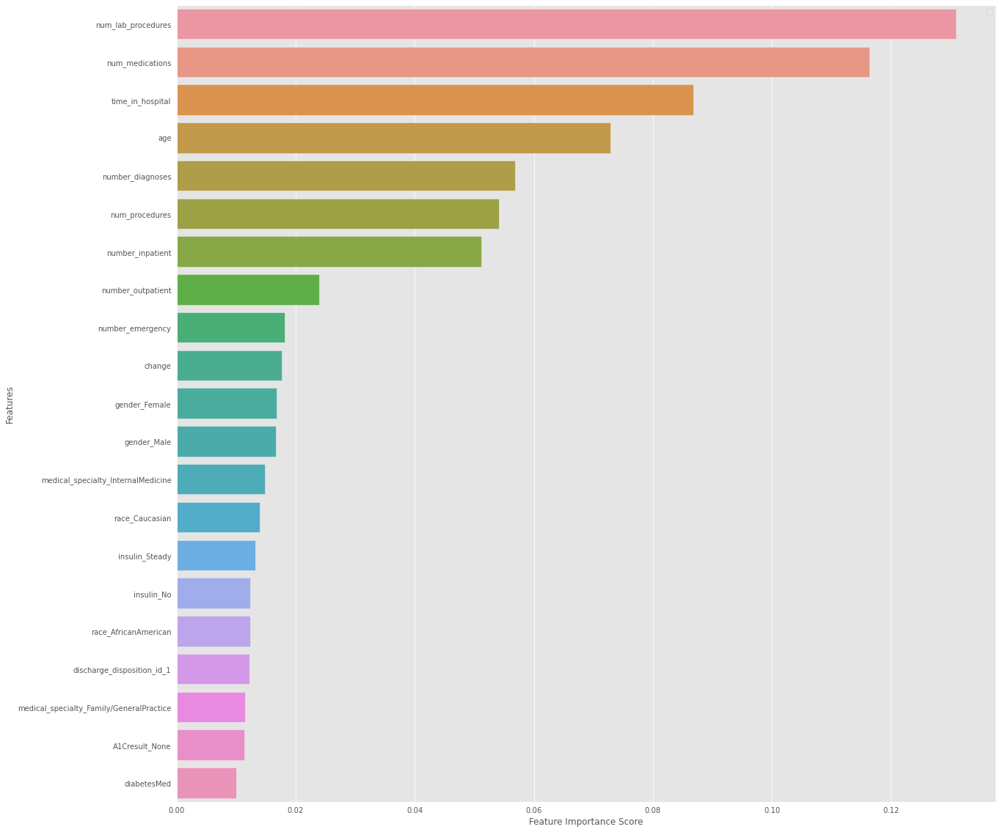

In [31]:
feature_imp = pd.Series(random_forest.feature_importances_,index=X_train.columns).sort_values(ascending=False)
feature_imp = feature_imp[feature_imp>0.01]
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.legend()
plt.show()

### XGBoost

Función XGBoost con modelo multiclase (3 clases)

In [32]:
avoid_columns = ['weight', 'encounter_id', 'patient_nbr', 'payer_code', 'diag_1', 'diag_2', 'diag_3']
categorical_columns = ['race',
                       'gender',
                       'admission_type_id',
                       'discharge_disposition_id',
                       'admission_source_id',
                       'medical_specialty',
                       'max_glu_serum',
                       'A1Cresult',
                       'insulin',
                       'cat_diag_1', 
                       'cat_diag_2', 
                       'cat_diag_3']

diabetes_model = one_hot_encoding(avoid_columns + columns_medication_avoid, categorical_columns, diabetes)

In [33]:
X_train, X_test, y_train, y_test = train_test_split(diabetes_model.drop(['readmitted'], axis=1), diabetes_model['readmitted'], test_size=0.2, random_state=0)

In [34]:
xgb_class = XGBClassifier(objective="multi:softmax", random_state=42, num_class=3)

In [35]:
xgb_class.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_class=3, num_parallel_tree=1,
              objective='multi:softprob', random_state=42, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [36]:
y_pred = xgb_class.predict(X_test)
print(get_metrics(y_test, y_pred))


Error con recall
Error con f1
acuraccy    0.593033
dtype: float64


--------------
### Tres modelos

Los anteriores clasificadores estaban pensados para una única variable de respuesta la cuál contenía la clase final (`NO`, `<30` y `>30`). Ahora intentaremos tener un clasificador binario para cada clase, con un total de tres clasificadores.

In [37]:
columns_medication_avoid = [x for x in columns_medication if x != 'insulin']
avoid_columns = ['weight', 'encounter_id', 'patient_nbr', 'payer_code', 'diag_1', 'diag_2', 'diag_3']
categorical_columns = ['race',
                       'gender',
                       'admission_type_id',
                       'discharge_disposition_id',
                       'admission_source_id',
                       'medical_specialty',
                       'max_glu_serum',
                       'cat_diag_1',
                       'cat_diag_2', 
                       'cat_diag_3',
                       'A1Cresult',
                       'insulin',
                       'readmitted']

diabetes_model = one_hot_encoding(avoid_columns + columns_medication_avoid, categorical_columns, diabetes)

In [38]:
X_train, X_test, y_train, y_test = train_test_split(
    diabetes_model.drop(['readmitted_NO', 'readmitted_<30', 'readmitted_>30'], axis=1), 
    diabetes_model[['readmitted_NO', 'readmitted_<30', 'readmitted_>30']], 
    test_size=0.2)

#### Random Forest

In [39]:
rf_no = RandomForestClassifier(n_estimators=100)
rf_lt30 = RandomForestClassifier(n_estimators=100)
rf_gt30 = RandomForestClassifier(n_estimators=100)

rf_no.fit(X_train,y_train['readmitted_NO'])
rf_lt30.fit(X_train,y_train['readmitted_<30'])
rf_gt30.fit(X_train,y_train['readmitted_>30'])


RandomForestClassifier()

In [40]:
results_rf_tres_modelos = pd.DataFrame()

y_pred = rf_no.predict(X_test)
results_rf_tres_modelos['readmitted_NO'] = get_metrics(y_test['readmitted_NO'], y_pred)

y_pred = rf_lt30.predict(X_test)
results_rf_tres_modelos['readmitted_<30'] = get_metrics(y_test['readmitted_<30'], y_pred)

y_pred = rf_gt30.predict(X_test)
results_rf_tres_modelos['readmitted_>30'] = get_metrics(y_test['readmitted_>30'], y_pred)
results_rf_tres_modelos

,readmitted_NO,readmitted_<30,readmitted_>30
acuraccy,0.641380,0.891220,0.656807
recall,0.704301,0.007665,0.193548
f1,0.679264,0.015125,0.284104


No handles with labels found to put in legend.


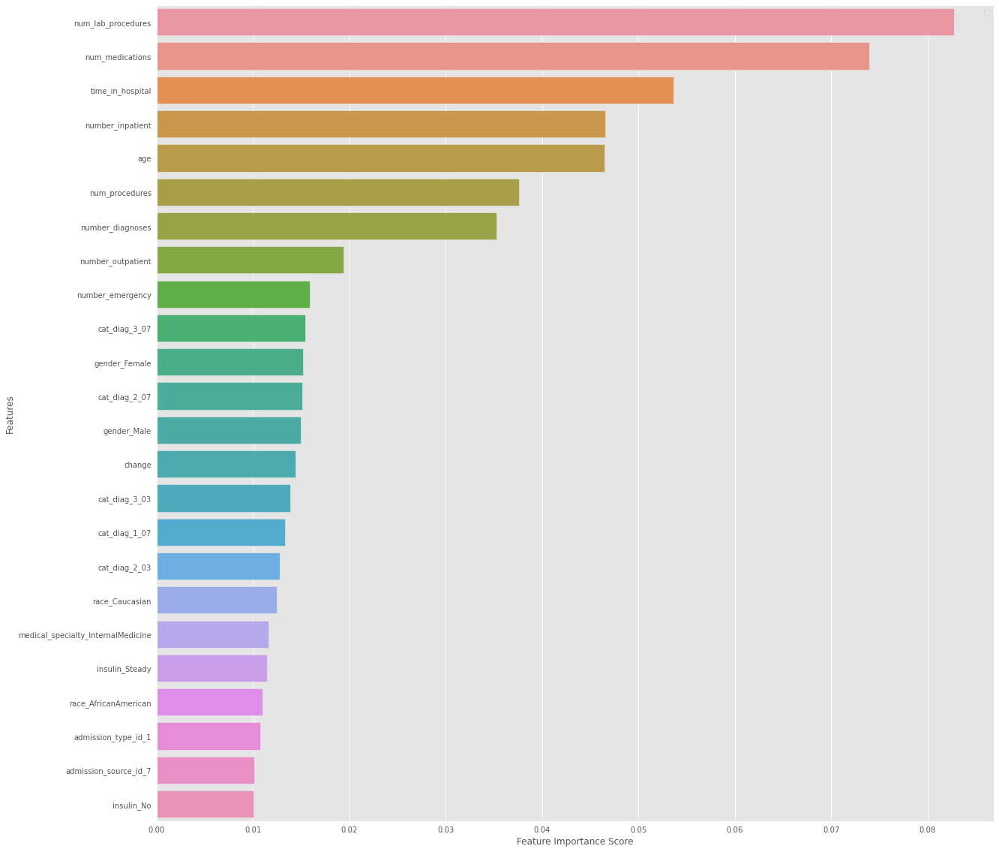

In [41]:
feature_imp = pd.Series(rf_lt30.feature_importances_,index=X_train.columns).sort_values(ascending=False)
feature_imp = feature_imp[feature_imp>0.01]
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.legend()
plt.show()

-----------
#### XGBoost

In [42]:
diabetes_model.rename(columns={'A1Cresult_>7': 'A1Cresult_7', 'A1Cresult_>8': 'A1Cresult_8'}, inplace=True)
diabetes_model.rename(columns={'max_glu_serum_>200': 'max_glu_serum_200', 'max_glu_serum_>300': 'max_glu_serum_300'}, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(
    diabetes_model.drop(['readmitted_NO', 'readmitted_<30', 'readmitted_>30'], axis=1), 
    diabetes_model[['readmitted_NO', 'readmitted_<30', 'readmitted_>30']], 
    test_size=0.2)

In [43]:
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

In [44]:
xgb = XGBClassifier(learning_rate=0.02, n_estimators=600, objective='binary:logistic', silent=True, nthread=1)

In [45]:
folds = 5
param_comb = 5

skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 1001)

xgb_no = RandomizedSearchCV(xgb, param_distributions=params, n_iter=param_comb, scoring='roc_auc', n_jobs=4, cv=skf.split(X_train, y_train['readmitted_NO']), verbose=3, random_state=1001 )
xgb_no.fit(X_train, y_train['readmitted_NO'])

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  25 out of  25 | elapsed: 43.3min finished


[10:06:53] WARNING: ../src/learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




RandomizedSearchCV(cv=<generator object _BaseKFold.split at 0x7f8ae45caad0>,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=0.02,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing...
                                           random_state=None, reg_alpha=None,
                                           reg_lambda=None,
                                           scale_pos_weight=None, silent=True,
                                           subsa

In [46]:
y_pred = xgb_no.predict(X_test)
print(get_metrics(y_test['readmitted_NO'], y_pred))

acuraccy    0.644721
recall      0.744597
f1          0.693121
dtype: float64


In [47]:
xgb_no = XGBClassifier(objective="binary:logistic", random_state=42)
xgb_lt30 = XGBClassifier(objective="binary:logistic", random_state=42)
xgb_gt30 = XGBClassifier(objective="binary:logistic", random_state=42)

xgb_no.fit(X_train,y_train['readmitted_NO'])
xgb_lt30.fit(X_train,y_train['readmitted_<30'])
xgb_gt30.fit(X_train,y_train['readmitted_>30'])

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [48]:
results_xgb_tres_modelos = pd.DataFrame()

y_pred = xgb_no.predict(X_test)
results_xgb_tres_modelos['readmitted_NO'] = get_metrics(y_test['readmitted_NO'], y_pred)

y_pred = xgb_lt30.predict(X_test)
results_xgb_tres_modelos['readmitted_<30'] = get_metrics(y_test['readmitted_<30'], y_pred)

y_pred = xgb_gt30.predict(X_test)
results_xgb_tres_modelos['readmitted_>30'] = get_metrics(y_test['readmitted_>30'], y_pred)
results_xgb_tres_modelos

,readmitted_NO,readmitted_<30,readmitted_>30
acuraccy,0.640495,0.888567,0.660443
recall,0.714234,0.032116,0.236890
f1,0.681634,0.060481,0.327789


### Modelo Leave One Out

In [49]:
diabetes_model.rename(columns={'A1Cresult_>7': 'A1Cresult_7', 'A1Cresult_>8': 'A1Cresult_8'}, inplace=True)
diabetes_model.rename(columns={'max_glu_serum_>200': 'max_glu_serum_200', 'max_glu_serum_>300': 'max_glu_serum_300'}, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(
    diabetes_model.drop(['readmitted_NO', 'readmitted_<30', 'readmitted_>30'], axis=1), 
    diabetes_model[['readmitted_NO', 'readmitted_<30', 'readmitted_>30']], 
    test_size=0.2)

In [50]:
xgb_no = XGBClassifier(objective="binary:logistic", random_state=0)

xgb_no.fit(X_train,y_train['readmitted_NO'])

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [51]:
diabetes_model = one_hot_encoding(avoid_columns + columns_medication_avoid, categorical_columns, diabetes[diabetes['readmitted'] != 'NO'])

In [52]:
diabetes_model.rename(columns={'A1Cresult_>7': 'A1Cresult_7', 'A1Cresult_>8': 'A1Cresult_8'}, inplace=True)
diabetes_model.rename(columns={'max_glu_serum_>200': 'max_glu_serum_200', 'max_glu_serum_>300': 'max_glu_serum_300'}, inplace=True)
X_train_30, X_test_30, y_train_30, y_test_30 = train_test_split(
    diabetes_model.drop(['readmitted_<30', 'readmitted_>30'], axis=1), 
    diabetes_model['readmitted_<30'], 
    test_size=0.2)

In [53]:
xgb_lt30 = XGBClassifier(objective="binary:logistic", random_state=42)

xgb_lt30.fit(X_train_30,y_train_30)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [54]:
results_xgb_dos_modelos = pd.DataFrame()

y_pred = xgb_no.predict(X_test)
results_xgb_dos_modelos['readmitted_NO'] = get_metrics(y_test['readmitted_NO'], y_pred)

y_pred = xgb_lt30.predict(X_test_30)
results_xgb_dos_modelos['readmitted_<30'] = get_metrics(y_test_30, y_pred)

results_xgb_dos_modelos

,readmitted_NO,readmitted_<30
acuraccy,0.640888,0.758448
recall,0.718593,0.105673
f1,0.682755,0.177197


--------
### Clustering
Usaremos kmeans para validar si encontramos alguna relación entre los datos y sus conjuntos de clase

In [55]:
columns_medication_avoid = [x for x in columns_medication if x != 'insulin']
avoid_columns = ['weight', 'encounter_id', 'patient_nbr', 'payer_code', 'diag_1', 'diag_2', 'diag_3']
categorical_columns = ['race',
                       'gender',
                       'admission_type_id',
                       'discharge_disposition_id',
                       'admission_source_id',
                       'medical_specialty',
                       'max_glu_serum',
                       'cat_diag_1',
                       'cat_diag_2', 
                       'cat_diag_3',
                       'A1Cresult',
                       'insulin']
diabetes_model = one_hot_encoding(avoid_columns + columns_medication_avoid, categorical_columns, diabetes, numerical_columns=numerical_columns, dummy=False)

In [56]:
X_train, X_test, y_train, y_test = train_test_split(
    diabetes_model[numerical_columns], 
    diabetes_model['readmitted'], 
    test_size=0.2)

Tres clusters es el primer indicio, dado que tenemos 3 clases. Graficaremos los resultados para validar los resultados

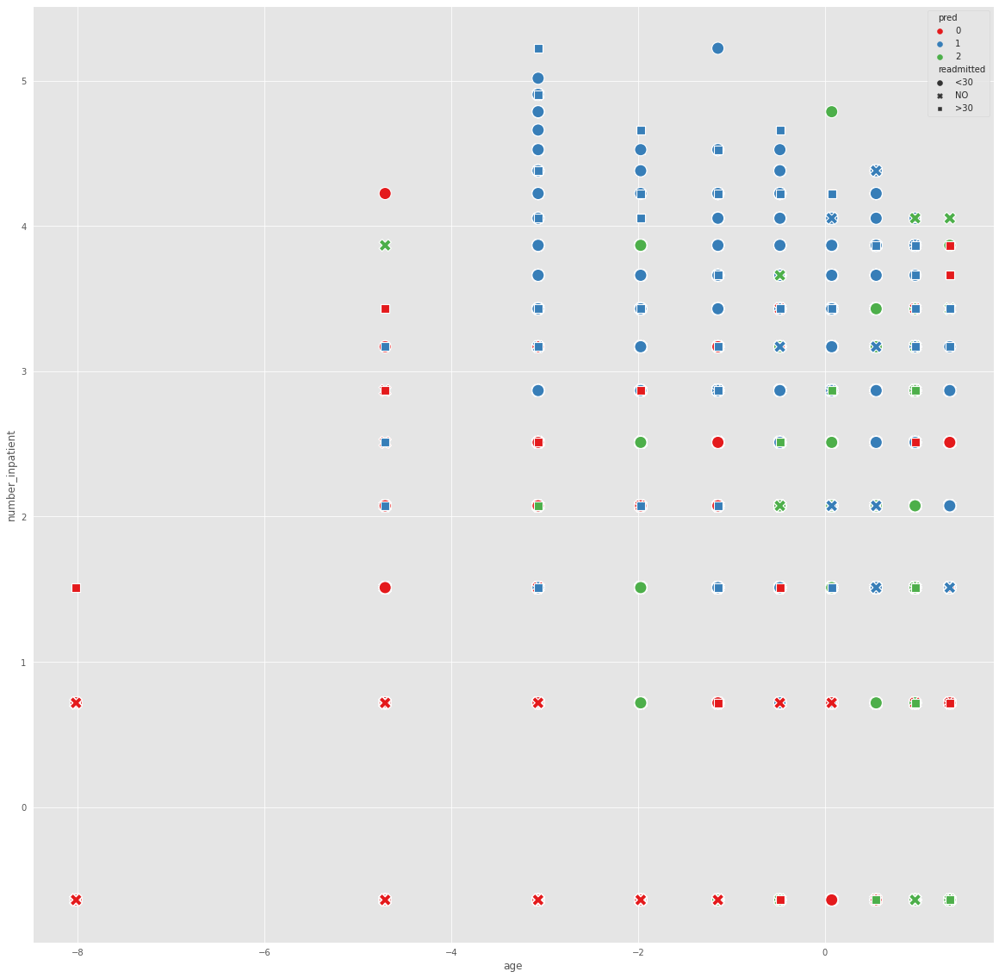

In [57]:
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X_train)
plot_df = X_train.copy()
plot_df['pred'] = pred_y
plot_df['readmitted'] = y_train
_ = sns.scatterplot(data=plot_df, x="age", y="number_inpatient", hue="pred", style="readmitted", s=200, palette="Set1")
##plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red')
##plt.show()

Tres clusters no parece poder separar bien las clases, buscaremos cuál es un punto idóneo de clusters para generar el modelo.

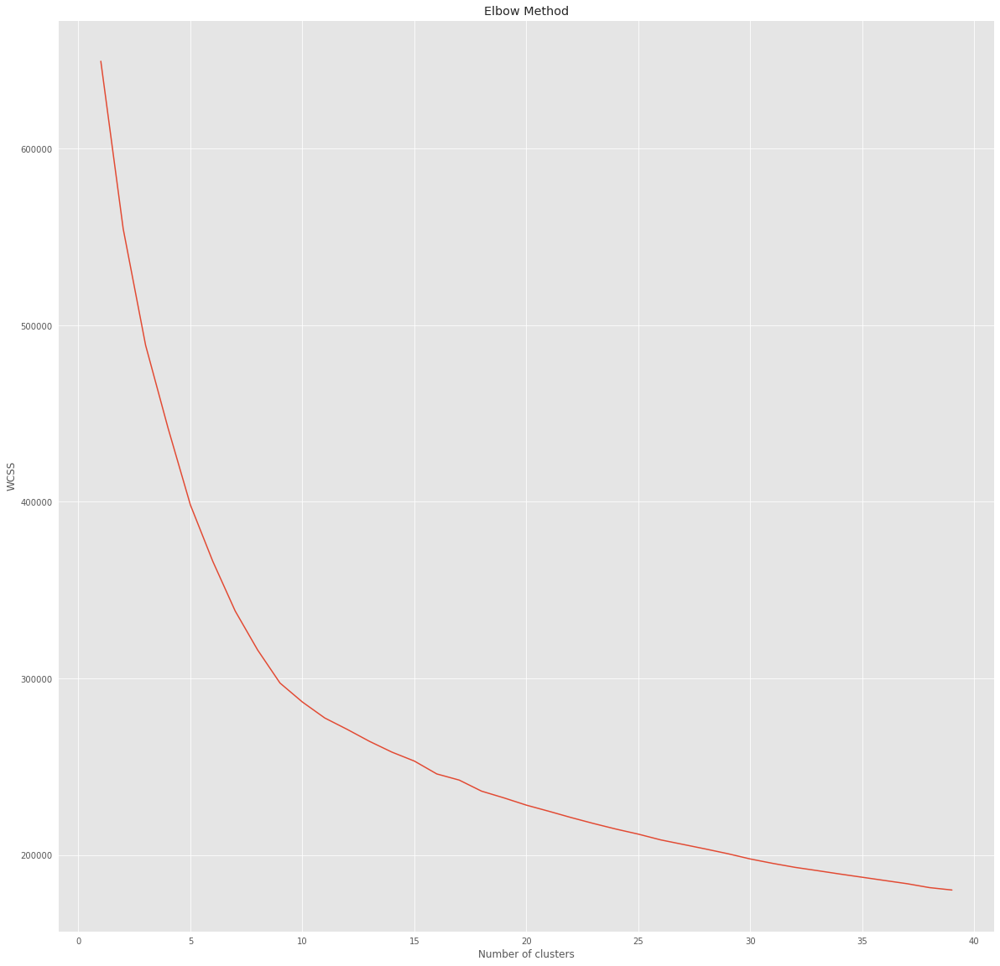

In [58]:
wcss = []
cluster_number = 40
for i in range(1, cluster_number):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X_train)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, cluster_number), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

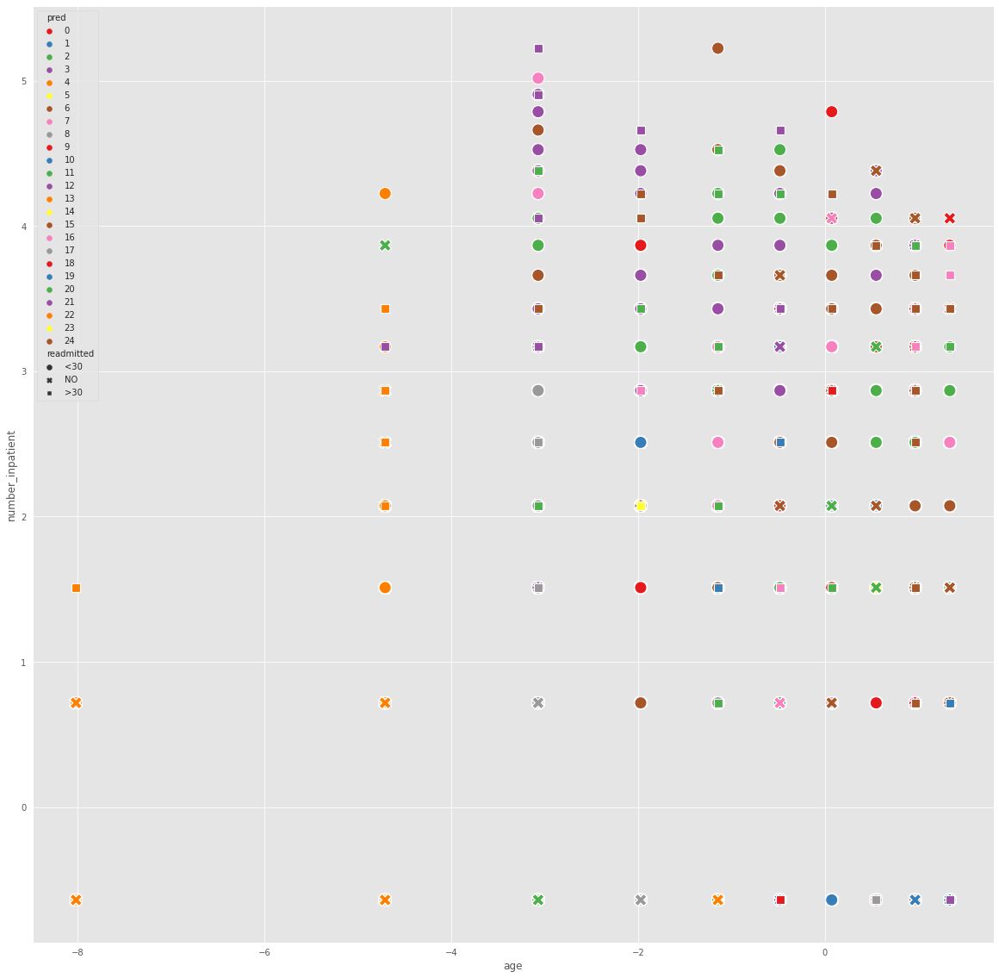

In [59]:
kmeans = KMeans(n_clusters=25, init='k-means++', max_iter=300, n_init=25, random_state=0)
kmeans.fit(X_train)
pred_y = kmeans.predict(X_train)
plot_df = X_train.copy()
plot_df['pred'] = pred_y
plot_df['readmitted'] = y_train
_ = sns.scatterplot(data=plot_df, x="age", y="number_inpatient", hue="pred", style="readmitted", s=200, palette="Set1")
##plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red')
##plt.show()

In [60]:
plot_df.groupby('pred')['readmitted'].value_counts(normalize=True).head(25)

pred  readmitted
0     NO            0.497567
      >30           0.396285
      <30           0.106148
1     NO            0.683677
      >30           0.247719
      <30           0.068604
2     NO            0.623653
      >30           0.293413
      <30           0.082934
3     NO            0.458685
      >30           0.437099
      <30           0.104216
4     NO            0.609236
      >30           0.308615
      <30           0.082149
5     NO            0.554958
      >30           0.350115
      <30           0.094927
6     >30           0.487314
      NO            0.309711
      <30           0.202975
7     >30           0.438828
      NO            0.412698
      <30           0.148474
8     NO            0.661662
Name: readmitted, dtype: float64

Podemos ver que las clases no están bien separadas, dado que dentro de los clusters tenemos una combinación muy variable de características (readmitted), y por ende nuestros clusters no representan dichas clases.

--------------
### Items Frecuentes
Intentaremos evaluar si hay características categóricas que marquen o puedan definir alguna de las clases objetivo.

In [61]:
diabetes_model = one_hot_encoding(avoid_columns + columns_medication_avoid, categorical_columns, diabetes, numerical_columns=[], dummy=False)
diabetes_model = pd.get_dummies(data=diabetes_model, columns=diabetes_model.columns)

In [62]:
frequent_itemsets = apriori(diabetes_model, min_support=0.6, use_colnames=True)
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(len)
frequent_itemsets.sort_values(by=['support'], ascending=False)

,support,itemsets,length
4,0.947466,(max_glu_serum_None),1
2,0.888142,(number_emergency_0.0),1
16,0.845671,"(number_emergency_0.0, max_glu_serum_None)",2
1,0.835510,(number_outpatient_0.0),1
5,0.832768,(A1Cresult_None),1
12,0.798768,"(number_outpatient_0.0, max_glu_serum_None)",2
20,0.783163,"(A1Cresult_None, max_glu_serum_None)",2
6,0.770034,(diabetesMed_1),1
11,0.762330,"(number_emergency_0.0, number_outpatient_0.0)",2
0,0.747806,(race_Caucasian),1


-----------
# Conclusiones

Vamos a analizar la siguiente gráfica obtenida anteriormente

![](pairplot_num.png)

Acá podemos ver una relación entre las variables `number_inpatient`, `number_outpatient` y los reingresos (`readmitted`) la cual puede ser expresada como:
**Entre más visitas haya tenido en el último año el paciente (tanto ambulatorias como internas), más alta probabilidad de que sea readmitido (un ingreso más)**
Esto tiene sentido dado que daría indicios de un estado de salud agravado en el paciente, el cual requerirá ingresos frecuentes al hospital.


##### Modelos

Ahora, sobre los modelos podemos ver que contemplando variables categoricas presentes en los datos, es costoso generar un modelo que permita predecir eficientemente las tres categorías, sin embargo sí podemos concluir sobre los resultados y las métricas obtenidas que predecir cuándo un paciente va a tener un reingreso en los siguientes 30 días es posible, pero definir si va a reingresar después de 30 días o "nunca" es más complicado y puede que los datos estén bastante mezclados en dicho escenario. Una teoría es que haya factores externos que afectan el reingreso y solo son evidentes en un tramo de más de 30 días, factores como la dieta del paciente o la disciplina con la que toma los medicamentos, lo que puede ser decisivo para que el paciente pueda recuperarse de la condición y evitar así el reingreso al hospital.

En cuanto a los factores que más pueden afectar el reingreso del paciente podemos ver en la siguiente gráfica obtenida anteriormente que los datos que suelen ser más relevantes para definir el reingreso son datos históricos referentes a ingresos al hospital en el último año, así como el tiempo que estuvo en el hospital, la cantidad de medicamentos, procedimientos y tomas laboratorios que se le hicieron al paciente durante la última estadía.
![](var_importante.png)

##### Resumen de modelos

Se usaron los siguientes modelos para evaluar los datos:
- All Features
    - Regresion Logística
    - Random Forest
- Solo Insulina
    - Regresion Logística
    - Random Forest
    - XGBoost
- Tres modelos (Binario)
    - Random Forest
    - XGBoost con refinamiento de hyperparámetros
    - XGBoost
- Leave One Out (Binario One Hot)
    - XGBoost
- Kmeans
    - 3 clusters (Primer indicio)
    - 20 clusters
- Apriori
    - Frecuent Items